In [3]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
import matplotlib
import matplotlib.pyplot as plt
import sklearn
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout, Flatten, MaxPooling2D, Conv2D, GlobalAveragePooling2D,BatchNormalization
from skimage import exposure
from skimage import transform
import os
from tensorflow.keras.optimizers import Adam
from sklearn.utils import class_weight
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from tensorflow.keras.preprocessing.image import ImageDataGenerator

/var/folders/h0/z8rnyvyx1454wmdznbvh69fh0000gn/T/ipykernel_7012/3737756389.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [18]:
df = pd.read_csv('./Hemorrhage Segmentation Project/hemorrhage-labels.csv')

In [19]:
def nameTypes(row):
    if row['any'] == 0:
        return "normal"
    if row['any'] == 1:
        # single type
        if (row['epidural'] == 1) & (row['intraparenchymal'] == 0) & (row['intraventricular'] == 0) & (row['subarachnoid'] == 0) & (row['subdural'] == 0):
            return "epidural"
        if (row['epidural'] == 0) & (row['intraparenchymal'] == 1) & (row['intraventricular'] == 0) & (row['subarachnoid'] == 0) & (row['subdural'] == 0):
            return "intraparenchymal"
        if (row['epidural'] == 0) & (row['intraparenchymal'] == 0) & (row['intraventricular'] == 1) & (row['subarachnoid'] == 0) & (row['subdural'] == 0):
            return "intraventricular"
        if (row['epidural'] == 0) & (row['intraparenchymal'] == 0) & (row['intraventricular'] == 0) & (row['subarachnoid'] == 1) & (row['subdural'] == 0):
            return "subarachnoid"
        if (row['epidural'] == 0) & (row['intraparenchymal'] == 0) & (row['intraventricular'] == 0) & (row['subarachnoid'] == 0) & (row['subdural'] == 1):
            return "subdural"

        # two types together combinations (10 in total)
        if (row['epidural'] == 1) & (row['intraparenchymal'] == 1) & (row['intraventricular'] == 0) & (row['subarachnoid'] == 0) & (row['subdural'] == 0):
            return "epi + intrap"
        if (row['epidural'] == 1) & (row['intraparenchymal'] == 0) & (row['intraventricular'] == 1) & (row['subarachnoid'] == 0) & (row['subdural'] == 0):
            return "epi + intrav"
        if (row['epidural'] == 1) & (row['intraparenchymal'] == 0) & (row['intraventricular'] == 0) & (row['subarachnoid'] == 1) & (row['subdural'] == 0):
            return "epi + suba"
        if (row['epidural'] == 1) & (row['intraparenchymal'] == 0) & (row['intraventricular'] == 0) & (row['subarachnoid'] == 0) & (row['subdural'] == 1):
            return "epi + subd"
        if (row['epidural'] == 0) & (row['intraparenchymal'] == 1) & (row['intraventricular'] == 1) & (row['subarachnoid'] == 0) & (row['subdural'] == 0):
            return "intrap + intrav"
        if (row['epidural'] == 0) & (row['intraparenchymal'] == 1) & (row['intraventricular'] == 0) & (row['subarachnoid'] == 1) & (row['subdural'] == 0):
            return "intrap + suba"
        if (row['epidural'] == 0) & (row['intraparenchymal'] == 1) & (row['intraventricular'] == 0) & (row['subarachnoid'] == 0) & (row['subdural'] == 1):
            return "intrap + subd"
        if (row['epidural'] == 0) & (row['intraparenchymal'] == 0) & (row['intraventricular'] == 1) & (row['subarachnoid'] == 1) & (row['subdural'] == 0):
            return "intrav + suba"
        if (row['epidural'] == 0) & (row['intraparenchymal'] == 0) & (row['intraventricular'] == 1) & (row['subarachnoid'] == 0) & (row['subdural'] == 1):
            return "intrav + subd"
        if (row['epidural'] == 0) & (row['intraparenchymal'] == 0) & (row['intraventricular'] == 0) & (row['subarachnoid'] == 1) & (row['subdural'] == 1):
            return "suba + subd"

        # three types together combinations (10 in total)
        if (row['epidural'] == 1) & (row['intraparenchymal'] == 1) & (row['intraventricular'] == 1) & (row['subarachnoid'] == 0) & (row['subdural'] == 0):
            return "epi + intrap + intrav"
        if (row['epidural'] == 1) & (row['intraparenchymal'] == 1) & (row['intraventricular'] == 0) & (row['subarachnoid'] == 1) & (row['subdural'] == 0):
            return "epi + intrap + suba"
        if (row['epidural'] == 1) & (row['intraparenchymal'] == 1) & (row['intraventricular'] == 0) & (row['subarachnoid'] == 0) & (row['subdural'] == 1):
            return "epi + intrap + subd"
        if (row['epidural'] == 1) & (row['intraparenchymal'] == 0) & (row['intraventricular'] == 1) & (row['subarachnoid'] == 1) & (row['subdural'] == 0):
            return "epi + intrav + suba"
        if (row['epidural'] == 1) & (row['intraparenchymal'] == 0) & (row['intraventricular'] == 1) & (row['subarachnoid'] == 0) & (row['subdural'] == 1):
            return "epi + intrav + subd"
        if (row['epidural'] == 1) & (row['intraparenchymal'] == 0) & (row['intraventricular'] == 0) & (row['subarachnoid'] == 1) & (row['subdural'] == 1):
            return "epi + suba + subd"
        if (row['epidural'] == 0) & (row['intraparenchymal'] == 1) & (row['intraventricular'] == 1) & (row['subarachnoid'] == 1) & (row['subdural'] == 0):
            return "intrap + intrav + suba"
        if (row['epidural'] == 0) & (row['intraparenchymal'] == 1) & (row['intraventricular'] == 1) & (row['subarachnoid'] == 0) & (row['subdural'] == 1):
            return "intrap + intrav + subd"
        if (row['epidural'] == 0) & (row['intraparenchymal'] == 1) & (row['intraventricular'] == 0) & (row['subarachnoid'] == 1) & (row['subdural'] == 1):
            return "intrap + suba + subd"
        if (row['epidural'] == 0) & (row['intraparenchymal'] == 0) & (row['intraventricular'] == 1) & (row['subarachnoid'] == 1) & (row['subdural'] == 1):
            return "intrav + suba + subd"

        # four types together combinations (5 in total)
        if (row['epidural'] == 1) & (row['intraparenchymal'] == 1) & (row['intraventricular'] == 1) & (row['subarachnoid'] == 1) & (row['subdural'] == 0):
            return "epi + intrap + intrav + suba"
        if (row['epidural'] == 1) & (row['intraparenchymal'] == 1) & (row['intraventricular'] == 1) & (row['subarachnoid'] == 0) & (row['subdural'] == 1):
            return "epi + intrap + intrav + subd"
        if (row['epidural'] == 1) & (row['intraparenchymal'] == 1) & (row['intraventricular'] == 0) & (row['subarachnoid'] == 1) & (row['subdural'] == 1):
            return "epi + intrap + suba + subd"
        if (row['epidural'] == 1) & (row['intraparenchymal'] == 0) & (row['intraventricular'] == 1) & (row['subarachnoid'] == 1) & (row['subdural'] == 1):
            return "epi + intrav + suba + subd"
        if (row['epidural'] == 0) & (row['intraparenchymal'] == 1) & (row['intraventricular'] == 1) & (row['subarachnoid'] == 1) & (row['subdural'] == 1):
            return "intrap + intrav + suba + subd"

        # all types together (1 only)
        if (row['epidural'] == 1) & (row['intraparenchymal'] == 1) & (row['intraventricular'] == 1) & (row['subarachnoid'] == 1) & (row['subdural'] == 1):
            return "all types"

In [20]:
df["type"] = df.apply(lambda row: nameTypes(row), axis = 1)

In [21]:
def assign_num(row):
    if row['type'] == 'epidural':
        return 0
    if row['type'] == 'intraparenchymal':
        return 1
    if row['type'] == 'intraventricular':
        return 2
    if row['type'] == 'subarachnoid':
        return 3
    if row['type'] == 'subdural':
        return 4
    if row['type'] == 'normal':
        return 5
    # two types combinations
    if row['type'] == 'epi + intrap':
        return 6
    if row['type'] == 'epi + intrav':
        return 7
    if row['type'] == 'epi + suba':
        return 8
    if row['type'] == 'epi + subd':
        return 9
    if row['type'] == 'intrap + intrav':
        return 10
    if row['type'] == 'intrap + suba':
        return 11
    if row['type'] == 'intrap + subd':
        return 12
    if row['type'] == 'intrav + suba':
        return 13
    if row['type'] == 'intrav + subd':
        return 14
    if row['type'] == 'suba + subd':
        return 15
    # three types combinations
    if row['type'] == 'epi + intrap + intrav':
        return 16
    if row['type'] == 'epi + intrap + suba':
        return 17
    if row['type'] == 'epi + intrap + subd':
        return 18
    if row['type'] == 'epi + intrav + suba':
        return 19
    if row['type'] == 'epi + intrav + subd':
        return 20
    if row['type'] == 'epi + suba + subd':
        return 21
    if row['type'] == 'intrap + intrav + suba':
        return 22
    if row['type'] == 'intrap + intrav + subd':
        return 23
    if row['type'] == 'intrap + suba + subd':
        return 24
    if row['type'] == 'intrav + suba + subd':
        return 25

    # four types combinations
    if row['type'] == 'epi + intrap + intrav + suba':
        return 26
    if row['type'] == 'epi + intrap + intrav + subd':
        return 27
    if row['type'] == 'epi + intrap + suba + subd':
        return 28
    if row['type'] == 'epi + intrav + suba + subd':
        return 29
    if row['type'] == 'intrap + intrav + suba + subd':
        return 30

    # all types
    if row['type'] == 'all types':
        return 31


In [22]:
df['num_represent'] = df.apply(lambda row: assign_num(row), axis = 1)

In [23]:
hemorrhage_type_dict = {
                        0: 'epidural',
                        1: 'intraparenchymal',
                        2: 'intraventricular',
                        3: 'subarachnoid',
                        4:'subdural',
                        5: 'normal',
                        6: 'epi + intrap',
                        7: 'epi + intrav',
                        8: 'epi + suba',
                        9: 'epi + subd',
                        10:'intrap + intrav',
                        11: 'intrap + suba',
                        12: 'intrap + subd',
                        13: 'intrav + suba',
                        14: 'intrav + subd',
                        15: 'suba + subd',
                        16:'epi + intrap + intrav',
                        17: 'epi + intrap + suba',
                        18: 'epi + intrap + subd',
                        19: 'epi + intrav + suba',
                        20: 'epi + intrav + subd',
                        21: 'epi + suba + subd',
                        22:'intrap + intrav + suba',
                        23: 'intrap + intrav + subd',
                        24: 'intrap + suba + subd',
                        25: 'intrav + suba + subd',
                        26: 'epi + intrap + intrav + suba',
                        27: 'epi + intrap + intrav + subd',
                        28:'epi + intrap + suba + subd',
                        29: 'epi + intrav + suba + subd',
                        30:'intrap + intrav + suba + subd',
                        31: 'all types',
                       }

In [26]:
print(df.head())
print(df.shape)

          Image  any  epidural  intraparenchymal  intraventricular  \
0  ID_000012eaf    0         0                 0                 0   
1  ID_000039fa0    0         0                 0                 0   
2  ID_00005679d    0         0                 0                 0   
3  ID_00008ce3c    0         0                 0                 0   
4  ID_0000950d7    0         0                 0                 0   

   subarachnoid  subdural    type  num_represent  
0             0         0  normal              5  
1             0         0  normal              5  
2             0         0  normal              5  
3             0         0  normal              5  
4             0         0  normal              5  
(752803, 9)


In [34]:
# retrive all the image IDs from `brain_window` directory
image_dir = './renders/brain_window_all'
images = os.listdir(image_dir)

In [35]:
# total number of images in `brain_window` folder
len(images)

114013

In [36]:
# if image id in data is contained in the `image` list, then return 'yes', representing it matches with the image id
def remove_wo_image(row):
    i = row['Image'] + '.jpg'
    if i not in images:
        return 'no'
    else:
        return 'yes'

In [37]:
df['match'] = df.apply(lambda row: remove_wo_image(row), axis=1)


In [38]:
df[df['match'] == 'yes'].shape

(114013, 10)

In [40]:
# 保存DataFrame为Excel文件
df.to_excel('./Hemorrhage Segmentation Project/hemorrhage-labels-final.xlsx', index=False)


In [33]:
import os
import shutil

# 源目录，包含多个子目录，每个子目录可能包含名为 'brain_window' 的文件夹
source_directory = './renders/'
# 目标目录，所有 'brain_window' 文件夹中的图片将被复制到这里
target_directory = './renders/brain_window_all'

# 如果目标文件夹不存在，创建它
if not os.path.exists(target_directory):
    os.makedirs(target_directory)

# 遍历源目录
for root, dirs, files in os.walk(source_directory):
    # 检查当前目录名是否为 'brain_window'
    if os.path.basename(root) == 'brain_window':
        # 遍历找到的 'brain_window' 文件夹中的所有文件
        for file in files:
            # 构建文件的完整路径
            file_path = os.path.join(root, file)
            # 检查文件是否为JPG图片
            if file_path.lower().endswith('.jpg'):
                # 构建目标路径
                target_path = os.path.join(target_directory, os.path.basename(file))
                # 复制文件
                shutil.copy(file_path, target_path)
                print(f'Copied {file_path} to {target_path}')


Copied ./renders/epidural/brain_window/ID_4fc7b65e5.jpg to ./renders/brain_window_all/ID_4fc7b65e5.jpg
Copied ./renders/epidural/brain_window/ID_1ba91b0ac.jpg to ./renders/brain_window_all/ID_1ba91b0ac.jpg
Copied ./renders/epidural/brain_window/ID_39d2b7c29.jpg to ./renders/brain_window_all/ID_39d2b7c29.jpg
Copied ./renders/epidural/brain_window/ID_291a8d316.jpg to ./renders/brain_window_all/ID_291a8d316.jpg
Copied ./renders/epidural/brain_window/ID_7d5f1d9d7.jpg to ./renders/brain_window_all/ID_7d5f1d9d7.jpg
Copied ./renders/epidural/brain_window/ID_d4f2436e1.jpg to ./renders/brain_window_all/ID_d4f2436e1.jpg
Copied ./renders/epidural/brain_window/ID_4a894c7ae.jpg to ./renders/brain_window_all/ID_4a894c7ae.jpg
Copied ./renders/epidural/brain_window/ID_d2b639726.jpg to ./renders/brain_window_all/ID_d2b639726.jpg
Copied ./renders/epidural/brain_window/ID_4900fa7a9.jpg to ./renders/brain_window_all/ID_4900fa7a9.jpg
Copied ./renders/epidural/brain_window/ID_2c76dd7d6.jpg to ./renders/brai

In [4]:
# labels for all data
labels = pd.read_excel('./Hemorrhage Segmentation Project/hemorrhage-labels-final.xlsx')

In [5]:
labels.head(10)


,Image,any,epidural,intraparenchymal,intraventricular,subarachnoid,subdural,type,num_represent,match
0,ID_000012eaf,0,0,0,0,0,0,normal,5,yes
1,ID_000039fa0,0,0,0,0,0,0,normal,5,yes
2,ID_00005679d,0,0,0,0,0,0,normal,5,yes
3,ID_00008ce3c,0,0,0,0,0,0,normal,5,yes
4,ID_0000950d7,0,0,0,0,0,0,normal,5,yes
5,ID_0000aee4b,0,0,0,0,0,0,normal,5,yes
6,ID_0000ca2f6,0,0,0,0,0,0,normal,5,yes
7,ID_0000f1657,0,0,0,0,0,0,normal,5,yes
8,ID_000178e76,0,0,0,0,0,0,normal,5,yes
9,ID_00019828f,0,0,0,0,0,0,normal,5,yes


In [6]:
# All the types
types = labels['type']
typeSet = set(types)
num_labels = len(typeSet)
print(num_labels)
typeSet

32


{'all types',
 'epi + intrap',
 'epi + intrap + intrav',
 'epi + intrap + intrav + suba',
 'epi + intrap + intrav + subd',
 'epi + intrap + suba',
 'epi + intrap + suba + subd',
 'epi + intrap + subd',
 'epi + intrav',
 'epi + intrav + suba',
 'epi + intrav + suba + subd',
 'epi + intrav + subd',
 'epi + suba',
 'epi + suba + subd',
 'epi + subd',
 'epidural',
 'intrap + intrav',
 'intrap + intrav + suba',
 'intrap + intrav + suba + subd',
 'intrap + intrav + subd',
 'intrap + suba',
 'intrap + suba + subd',
 'intrap + subd',
 'intraparenchymal',
 'intrav + suba',
 'intrav + suba + subd',
 'intrav + subd',
 'intraventricular',
 'normal',
 'suba + subd',
 'subarachnoid',
 'subdural'}

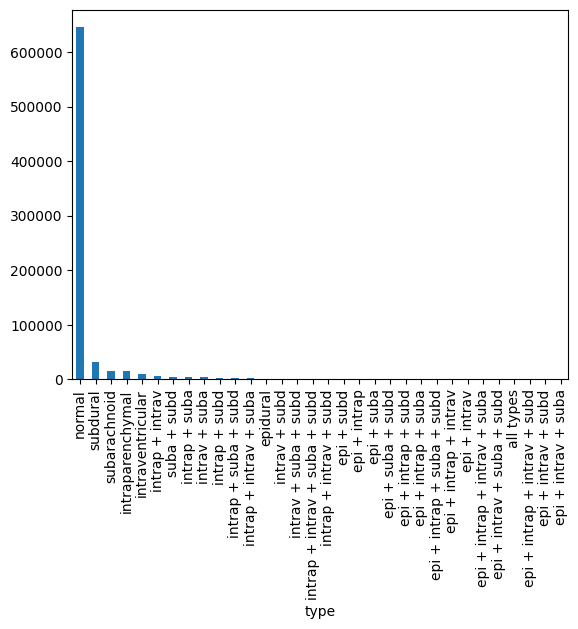

In [7]:
# The distribution of dataset for all different types
labels['type'].value_counts().plot(kind = 'bar')
plt.savefig('distribution.jpg',bbox_inches='tight',dpi = 150)

In [8]:
labels['type'].value_counts()

type
normal                           644870
subdural                          32200
subarachnoid                      16423
intraparenchymal                  15664
intraventricular                   9878
intrap + intrav                    6817
suba + subd                        5082
intrap + suba                      3932
intrav + suba                      3677
intrap + subd                      3311
intrap + suba + subd               2198
intrap + intrav + suba             1955
epidural                           1694
intrav + subd                      1084
intrav + suba + subd                968
intrap + intrav + suba + subd       871
intrap + intrav + subd              728
epi + subd                          382
epi + intrap                        281
epi + suba                          220
epi + suba + subd                   108
epi + intrap + subd                  93
epi + intrap + suba                  88
epi + intrap + suba + subd           52
epi + intrap + intrav              

In [9]:
labels['type'].value_counts().reset_index().to_csv('detailed_distribution.csv')

In [10]:
file_dir = './renders/brain_window_all/'
suffix = '.jpg'

(512, 512, 3)


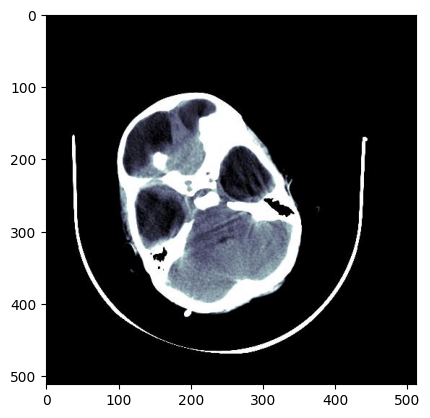

In [11]:
#load sample image
sample = matplotlib.image.imread(file_dir + 'ID_000178e76.jpg')
plt.imshow(sample)
print(sample.shape)

(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)


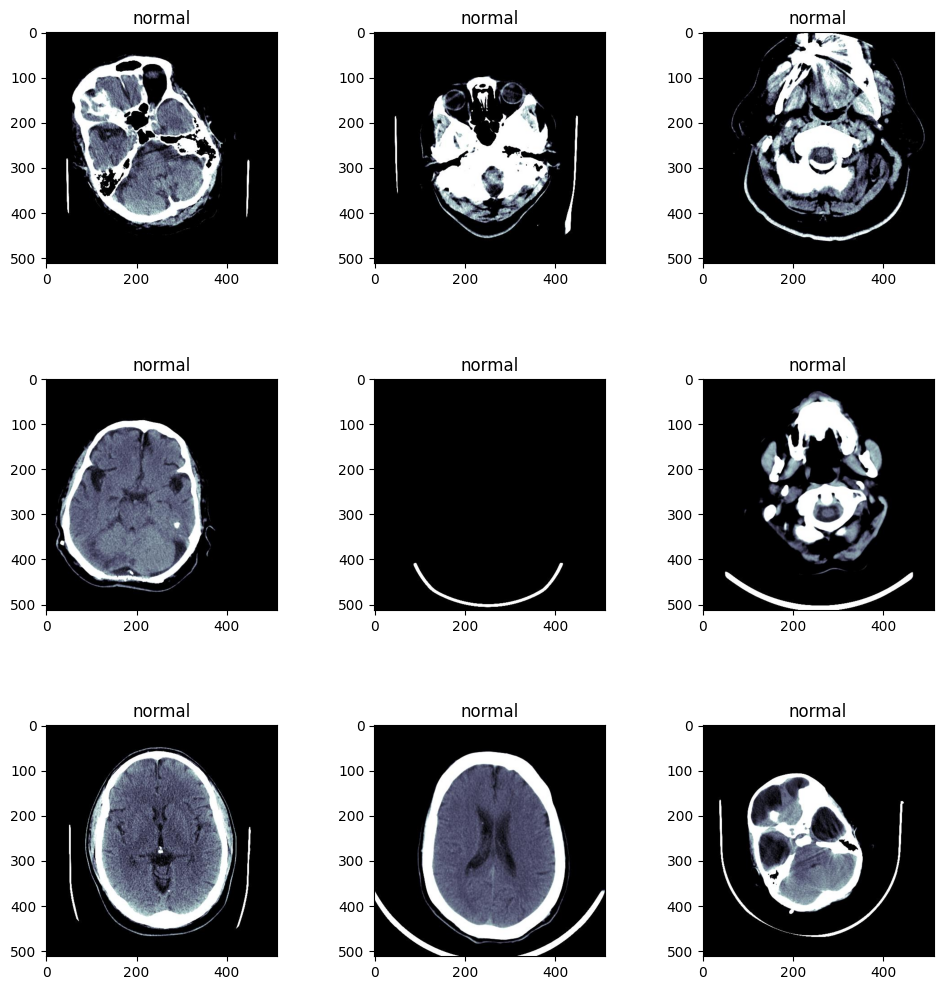

In [12]:
# Load the sample dataset
n_rows = 3
n_cols = 3
plt.figure(figsize=(12,12))
for row in range(n_rows):
    for col in range(n_cols):
        index = n_cols * row + col
        plt.subplot(n_rows, n_cols, index + 1)
        im = matplotlib.image.imread(file_dir + str(labels.Image.iloc[index])+suffix)
        plt.imshow(im)
        plt.title(labels.type.iloc[index], fontsize=12)
        print(im.shape)
plt.subplots_adjust(wspace=0.2, hspace=0.5)

plt.show()

In [13]:
# 假设 labels 是您的原始DataFrame
typeSet = labels['type'].unique()  # 获取所有唯一的类型

moreThan = []
lessThan = []

# 计算每个类型的计数并分类
for i in typeSet:
    if labels['type'].value_counts()[i] >= 500:
        moreThan.append(i)
    else:
        lessThan.append(i)

# 使用列表推导和concat来创建新的DataFrame
frames_more = [labels[labels['type'] == i].iloc[:500] for i in moreThan]
frames_less = [labels[labels['type'] == i] for i in lessThan]

# 将列表中的所有DataFrame合并成一个DataFrame
df = pd.concat(frames_more + frames_less)

# 混洗数据集
df = df.sample(frac=1).reset_index(drop=True)

# 查看头部数据
print(df.head(10))

          Image  any  epidural  intraparenchymal  intraventricular  \
0  ID_0a6a42f76    1         0                 0                 1   
1  ID_9d9d6e1ca    1         1                 0                 0   
2  ID_010839082    1         0                 0                 0   
3  ID_175bda755    1         0                 1                 1   
4  ID_25b2a99e2    1         0                 0                 1   
5  ID_19924f1c8    1         1                 0                 0   
6  ID_0dcfadadd    1         0                 1                 1   
7  ID_034e68160    1         0                 1                 1   
8  ID_002875d91    0         0                 0                 0   
9  ID_022d823c1    1         0                 1                 1   

   subarachnoid  subdural                           type  num_represent match  
0             0         0               intraventricular              2   yes  
1             1         0                     epi + suba             

In [14]:
df.shape

(9951, 10)

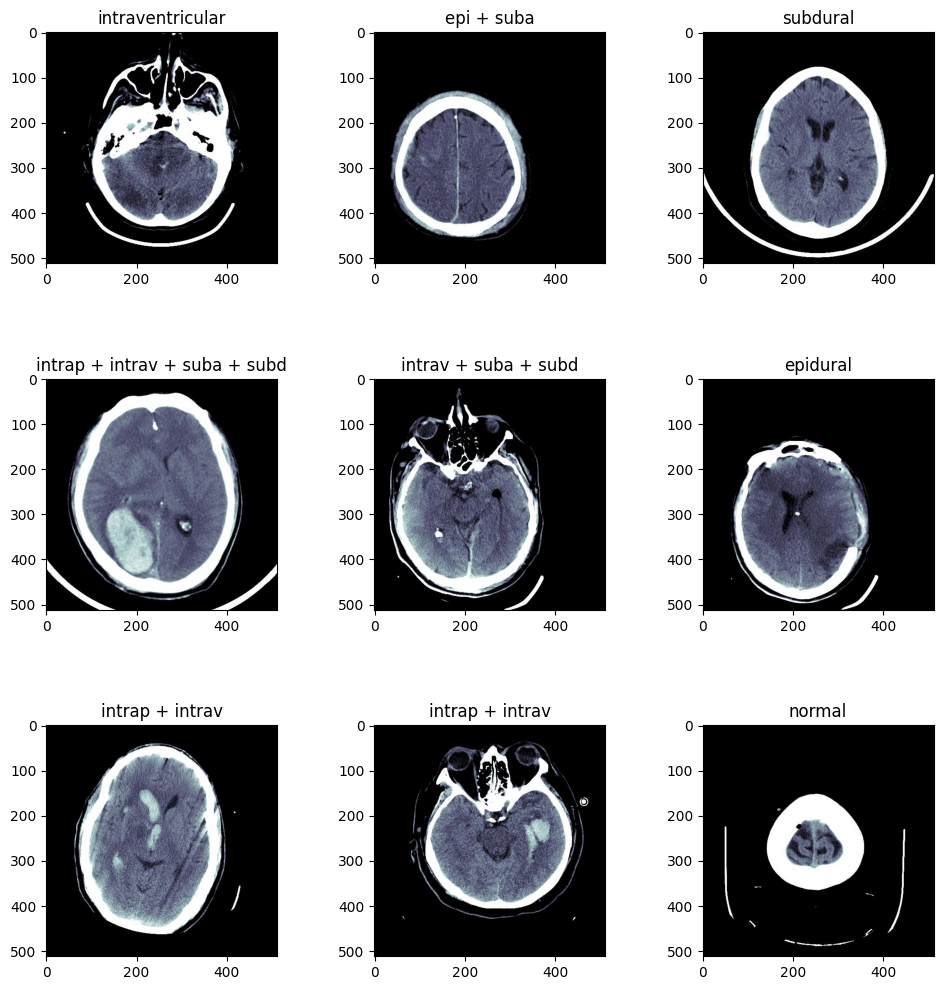

In [15]:
# Load sample dataset
n_rows = 3
n_cols = 3
plt.figure(figsize=(12,12))
for row in range(n_rows):
    for col in range(n_cols):
        index = n_cols * row + col
        plt.subplot(n_rows, n_cols, index + 1)
        im = matplotlib.image.imread(file_dir + str(df.Image.iloc[index])+suffix)
        plt.imshow(im)
        plt.title(df.type.iloc[index], fontsize=12)
plt.subplots_adjust(wspace=0.2, hspace=0.5)

plt.show()

(350, 350, 3)


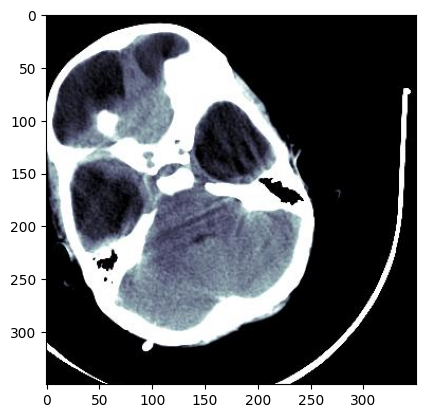

In [16]:
# Try croping the original image
sample = matplotlib.image.imread(file_dir + 'ID_000178e76.jpg')
crop = sample[100:450, 100:450, :]
plt.imshow(crop)
print(crop.shape)

(224, 224, 3)


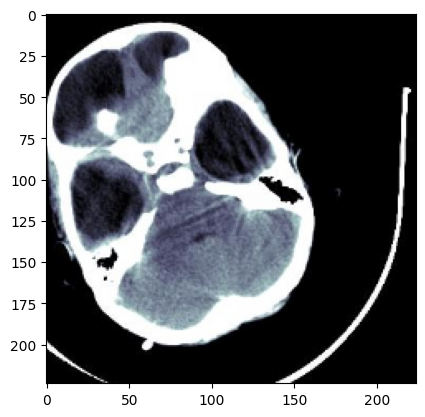

In [17]:
# Try resize the sample image
image_resize = transform.resize(crop, (224, 224))
plt.imshow(image_resize)
print(image_resize.shape)

In [18]:
data = []
data_x = df.Image
for image in data_x:
    image_name = matplotlib.image.imread(file_dir + str(image)+suffix)
    crop  = image_name[100:450, 100:450, :] #crop the image
    image_resize = transform.resize(crop, (224, 224)) #resize the image
    data.append(image_resize)

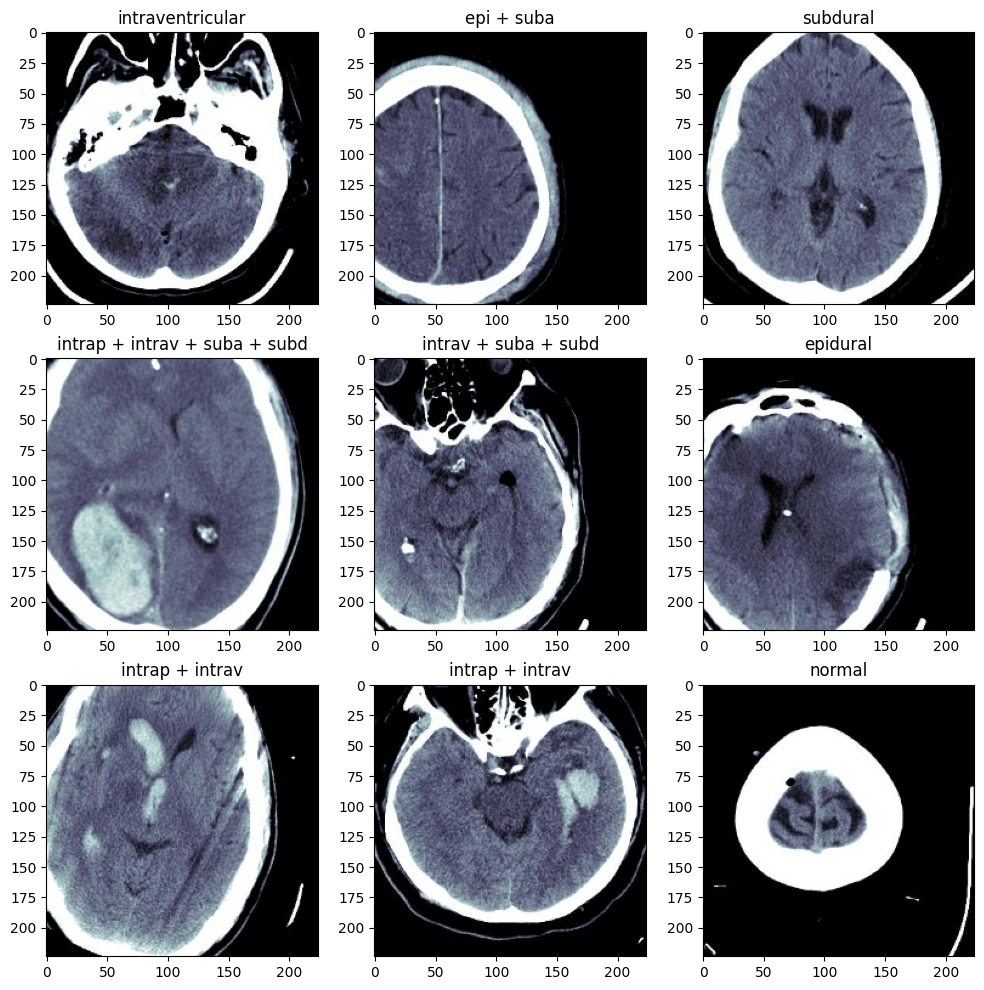

In [19]:
# Plot sample images with resizing and croping
plt.figure(figsize=(12, 12))
for index in range(9):
    plt.subplot(3, 3, index + 1)
    plt.imshow(data[index])
    plt.title(df.type.iloc[index])

plt.show()

In [20]:
# x data
Train = np.array(data)
print(Train.shape)
# y data
y = np.array(df['num_represent'])
print(y.shape)

(9951, 224, 224, 3)
(9951,)


In [21]:
# Split the data: 80% training data, 20% testing and validation
x_train, x_rem, y_train, y_rem = train_test_split(Train, y, train_size=0.8, random_state=42)

print("x_train", x_train.shape)
print("x_rem", x_rem.shape) #remaining(validation + test)
print("y_train", y_train.shape)
print("y_rem", y_rem.shape)

x_train (7960, 224, 224, 3)
x_rem (1991, 224, 224, 3)
y_train (7960,)
y_rem (1991,)


In [22]:
# Split the remaining data: 50% testing and 50% validation
x_val, x_test, y_val, y_test = train_test_split(x_rem, y_rem, test_size = 0.5, random_state = 42)

print("x_val", x_val.shape)
print("x_test", x_test.shape)
print("y_val", y_val.shape)
print("y_test", y_test.shape)

x_val (995, 224, 224, 3)
x_test (996, 224, 224, 3)
y_val (995,)
y_test (996,)


In [23]:
# Normalize the data
X_train = x_train/255
X_val = x_val/255
X_test = x_test/255

# Convert Y values into one-hot-encoding
Y_train = to_categorical(y_train, num_labels)
Y_val = to_categorical(y_val, num_labels)
Y_test = to_categorical(y_test, num_labels)

print("x_train", X_train.shape)
print("x_test", X_test.shape)
print("x_val", X_val.shape)
print("y_train", Y_train.shape)
print("y_test", Y_test.shape)
print("y_val", Y_val.shape)

x_train (7960, 224, 224, 3)
x_test (996, 224, 224, 3)
x_val (995, 224, 224, 3)
y_train (7960, 32)
y_test (996, 32)
y_val (995, 32)


In [24]:
# calculate the class weights
from sklearn.utils import class_weight
class_weights = class_weight.compute_class_weight(
                                        class_weight = "balanced",
                                        classes = np.unique(y_train),
                                        y = y_train
                                    )
class_weights = dict(zip(np.unique(y_train), class_weights))
class_weights

{0: 0.6172456575682382,
 1: 0.6281565656565656,
 2: 0.6329516539440203,
 3: 0.6096813725490197,
 4: 0.6234335839598998,
 5: 0.625,
 6: 1.1845238095238095,
 7: 8.024193548387096,
 8: 1.3023560209424083,
 9: 0.8291666666666667,
 10: 0.6345663265306123,
 11: 0.6126847290640394,
 12: 0.6234335839598998,
 13: 0.6203241895261845,
 14: 0.6546052631578947,
 15: 0.6081907090464548,
 16: 6.909722222222222,
 17: 3.316666666666667,
 18: 3.273026315789474,
 19: 22.613636363636363,
 20: 15.546875,
 21: 2.674731182795699,
 22: 0.6126847290640394,
 23: 0.6187810945273632,
 24: 0.6378205128205128,
 25: 0.6313451776649747,
 26: 7.7734375,
 27: 15.546875,
 28: 6.546052631578948,
 29: 9.567307692307692,
 30: 0.6037621359223301,
 31: 11.845238095238095}

In [25]:
from sklearn.tree import DecisionTreeClassifier

In [26]:
# Convert X_train
nsamples, nx, ny, nrgb = X_train.shape
X_train2 = X_train.reshape((nsamples,nx*ny*nrgb))
X_train2.shape

(7960, 150528)

In [27]:
# Convert X_val
nsamples1, nx1, ny1, nrgb1 = X_val.shape
X_val2 = X_val.reshape((nsamples1,nx1*ny1*nrgb1))
X_val2.shape

(995, 150528)

In [28]:
# Convert X_test
nsamples2, nx2, ny2, nrgb2 = X_test.shape
X_test2 = X_test.reshape((nsamples2,nx2*ny2*nrgb2))
X_test2.shape

(996, 150528)

In [29]:
#build decision tree model
dtree = DecisionTreeClassifier()
dtree.fit(X_train2, y_train)

DecisionTreeClassifier()

In [30]:
from sklearn.metrics import accuracy_score
# Predicted result for validation data
y_pred=dtree.predict(X_val2)
accuracy_score(y_pred,y_val)

0.11457286432160804